# Introduction


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r '/content/drive/MyDrive/DeepLearning/data.zip' /content/

verify NVIDIA GPU Availibity

In [ ]:
!nvidia-smi

Tue Apr 22 15:37:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   60C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!unzip -q /content/data.zip -d /content/custom_data

Ultralytics requires a particular folder structure to store training data models. The root folder is named "data". Inside, the are two main folders:


1.   **Train** These are the actual images used to train the model. In one epoch of training, every image in the train set is passed into the neural network. The training algorithm adjusts the network weights to fit the data in the images.
2.   **Validation** These images are used to check the model's perfomance at the end of each training epoch.



For this test we will automatically create the required folder structure and randomly move 90% of dataset to the "train" folder and the 10% to the "validation" folder.


In [ ]:
import os
import random
import shutil

images_dir = "/content/custom_data/data/images"
labels_dir = "/content/custom_data/data/labels"

output_base = "data"
train_img_dir = os.path.join(output_base, "train", "images")
train_lbl_dir = os.path.join(output_base, "train", "labels")
val_img_dir = os.path.join(output_base, "val", "images")
val_lbl_dir = os.path.join(output_base, "val", "labels")

# Create output directories
for dir_path in [train_img_dir, train_lbl_dir, val_img_dir, val_lbl_dir]:
    os.makedirs(dir_path, exist_ok=True)

# List and shuffle image files
image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.png'))]
random.shuffle(image_files)

# Split: 90% for training, 10% for validation
split_index = int(0.9 * len(image_files))
train_files = image_files[:split_index]
val_files = image_files[split_index:]

def move_files(file_list, img_dst, lbl_dst):
    for file_name in file_list:
        name_no_ext = os.path.splitext(file_name)[0]
        label_file = f"{name_no_ext}.txt"

        shutil.copy(os.path.join(images_dir, file_name), os.path.join(img_dst, file_name))
        if os.path.exists(os.path.join(labels_dir, label_file)):
            shutil.copy(os.path.join(labels_dir, label_file), os.path.join(lbl_dst, label_file))
        else:
            print(f"Label not found for: {file_name}")

move_files(train_files, train_img_dir, train_lbl_dir)
move_files(val_files, val_img_dir, val_lbl_dir)

print("Split completed. Final directory structure:")
print(f"- {train_img_dir}")
print(f"- {val_img_dir}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/custom_data/data/images'

In [ ]:
#!rm -r data/

### Install Requirements (Ultralytics)

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 71.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

# Data.yaml file

The data.yaml file is used to configure your dataset when training YOLO models. It tells the model:


*   Where our training and validation images are (train: and val:)
*   How many object classes we have (nc:)
*   What the class names are (names:)

In [ ]:
with open("data.yaml", "w") as f:
    f.write("""
train: data/train/images
val: data/val/images

nc: 4
names: ['Impacted', 'Caries', 'Periapical Lesion', 'Deep Caries']
""")

# Training Model

### Training Parameters

**Model architecture & size**

**Number of epochs**

**Resolution**

In [ ]:
!yolo detect train data=/content/data.yaml model=yolov8n.pt epochs=20 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100% 6.25M/6.25M [00:00<00:00, 131MB/s]
Ultralytics 8.3.117 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou

## Test Model

With the model trainned, now we must test it! The commands bellow run the model on the images in the validation folder and then display the results for the first 10 images.

In [ ]:
!yolo detect predict model=runs/detect/train/weights/best.pt source=data/val/images save=True

Ultralytics 8.3.117 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs

image 1/70 /content/data/val/images/train_100.png: 224x416 1 quadrant_1, 1 quadrant_2, 1 quadrant_3, 1 quadrant_4, 32.4ms
image 2/70 /content/data/val/images/train_117.png: 224x416 1 quadrant_1, 1 quadrant_2, 1 quadrant_3, 1 quadrant_4, 6.7ms
image 3/70 /content/data/val/images/train_129.png: 224x416 1 quadrant_1, 1 quadrant_2, 1 quadrant_3, 1 quadrant_4, 6.6ms
image 4/70 /content/data/val/images/train_131.png: 224x416 1 quadrant_1, 1 quadrant_2, 1 quadrant_3, 1 quadrant_4, 6.4ms
image 5/70 /content/data/val/images/train_135.png: 224x416 1 quadrant_1, 1 quadrant_2, 1 quadrant_3, 1 quadrant_4, 6.3ms
image 6/70 /content/data/val/images/train_137.png: 224x416 1 quadrant_1, 1 quadrant_2, 1 quadrant_3, 1 quadrant_4, 6.9ms
image 7/70 /content/data/val/images/train_139.png: 224x416 1 quadrant_1, 1 quadrant_2, 1 quadrant_3, 1 quadra

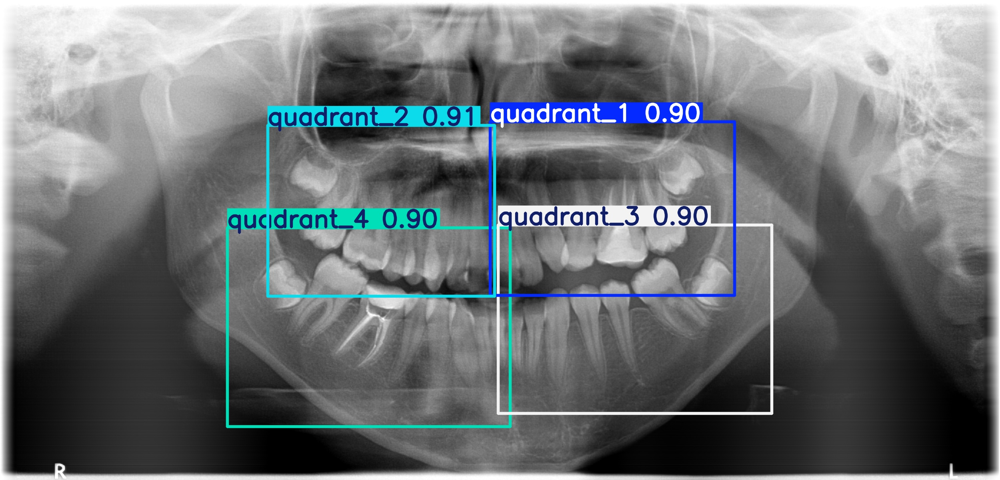

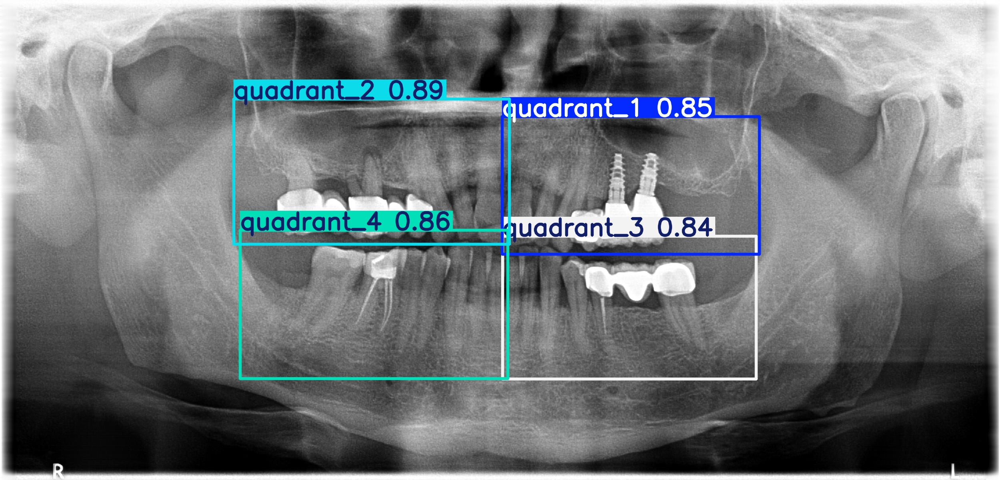

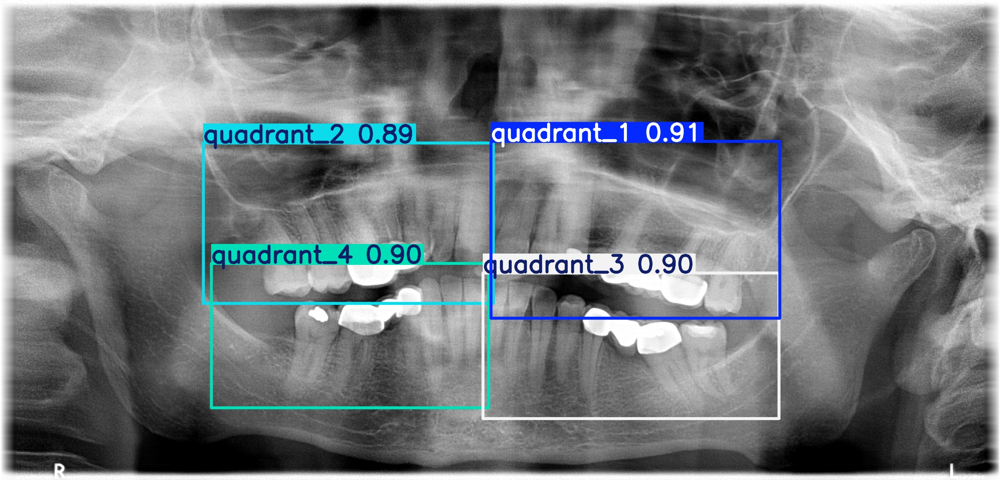

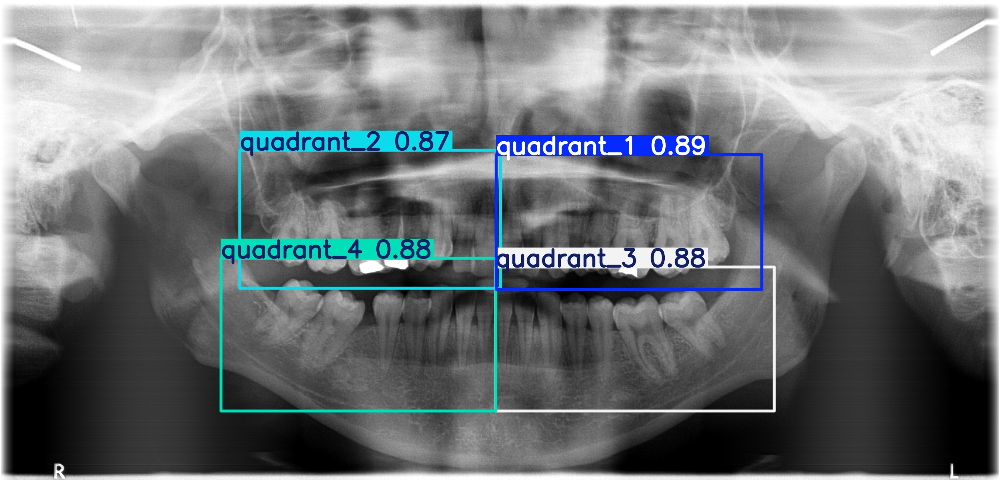

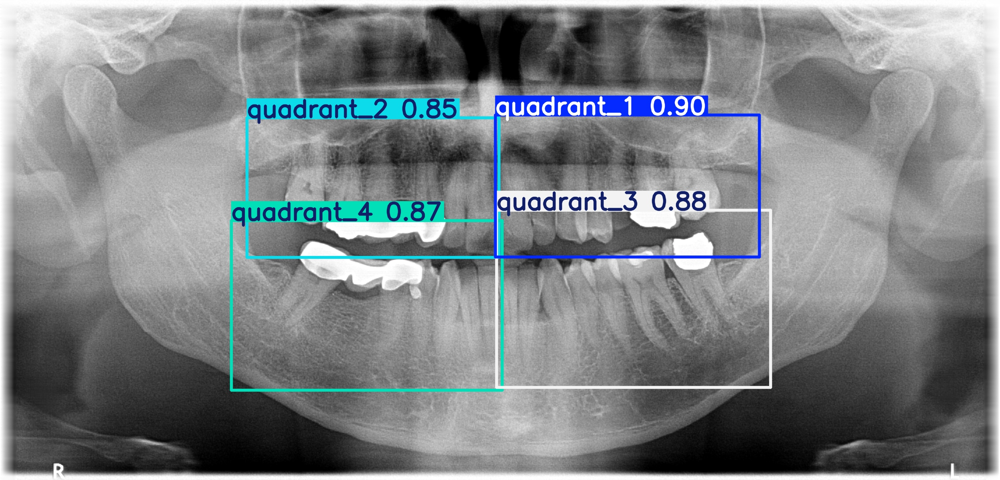

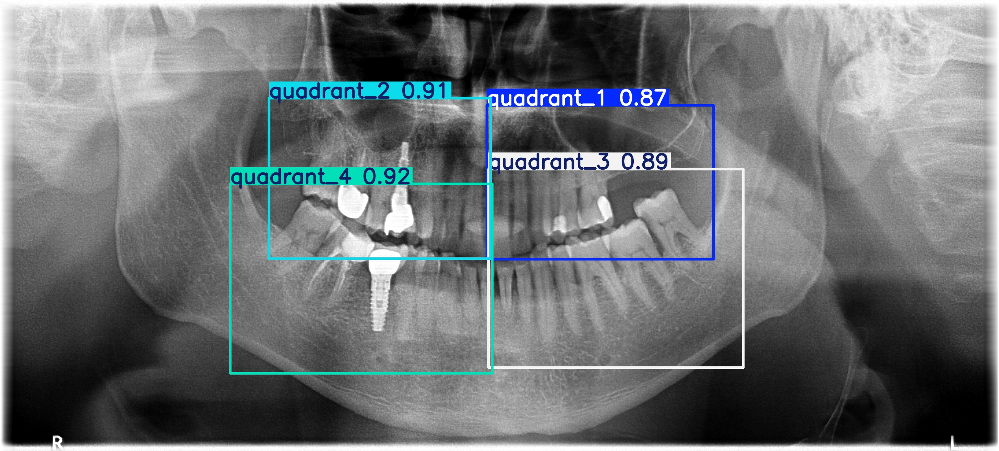

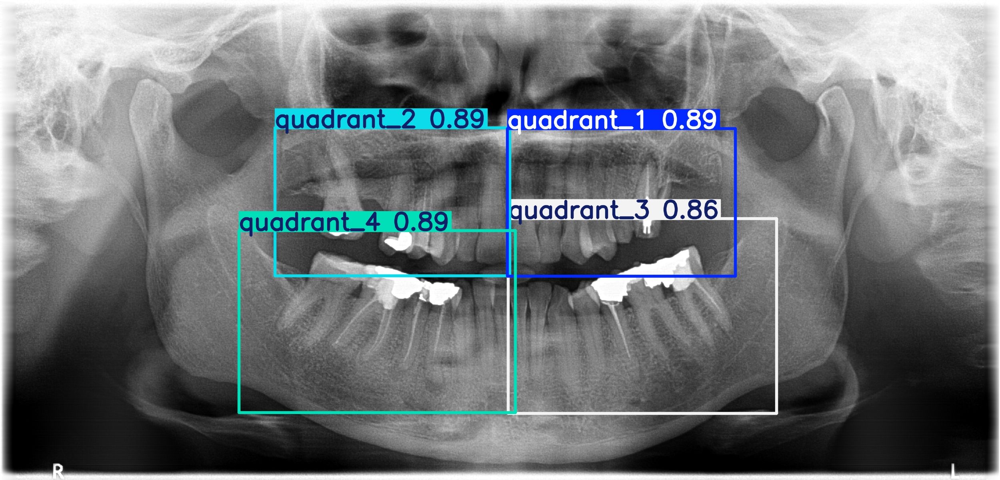

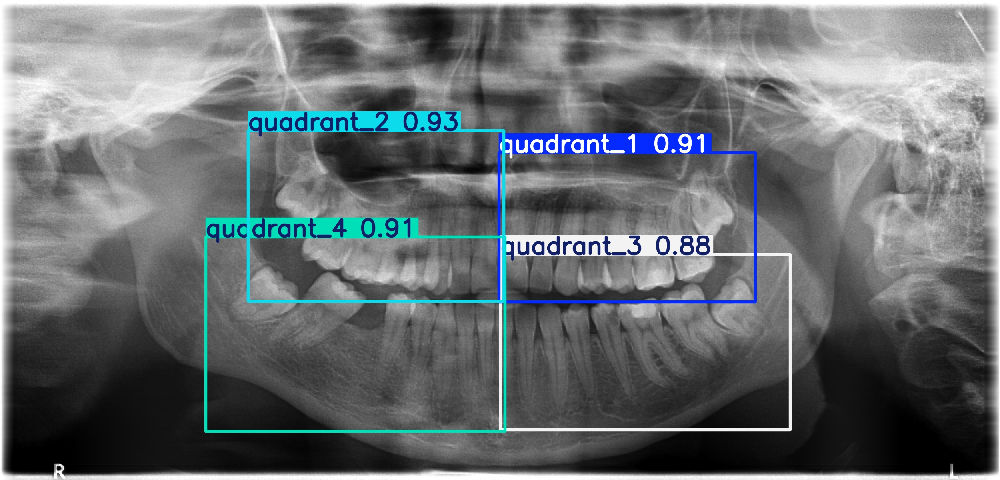

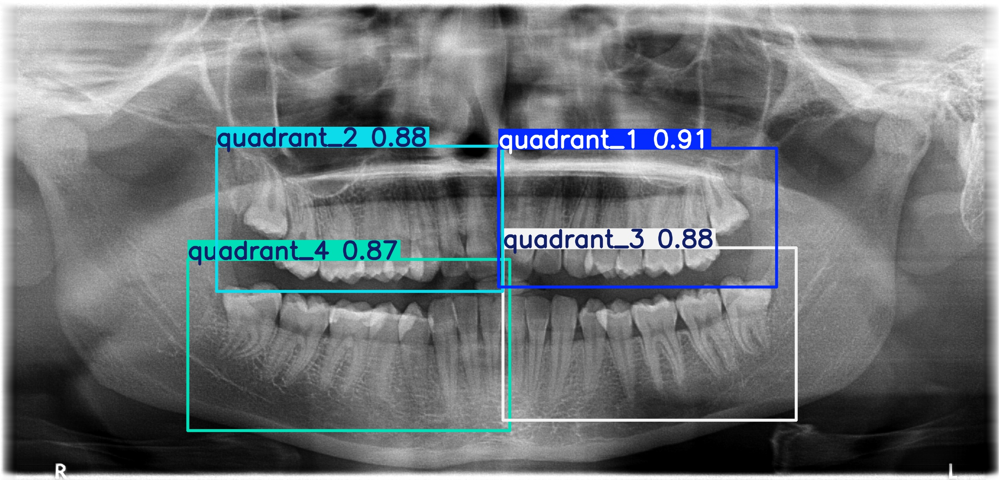

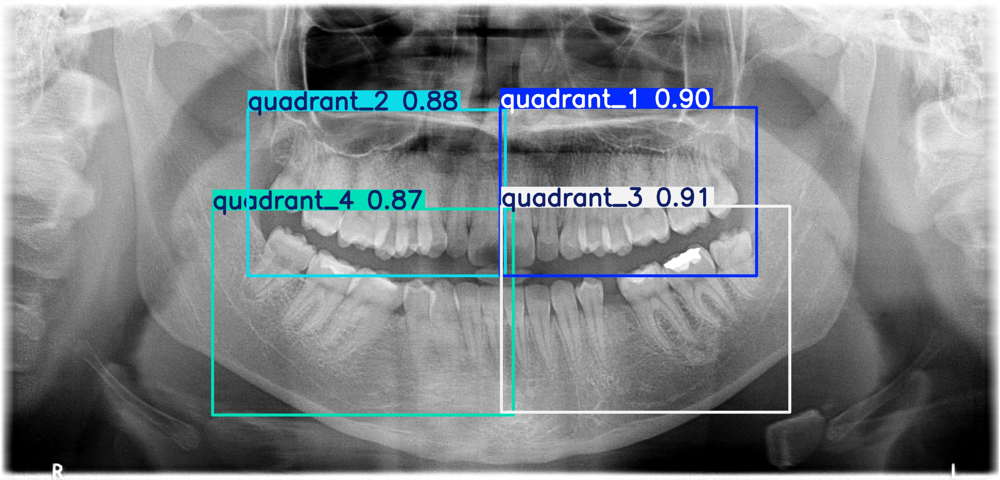

In [ ]:
import glob
from IPython.display import Image, display
for image_path in glob.glob('runs/detect/predict/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')